In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ! ln -s /content/drive/MyDrive/datasets/BreakHis_v1 /content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors/datasets

In [ ]:
! ln -s /content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors/ /content

In [ ]:
%cd BreakHis_Activation-Map-Generation-Noised-Latent-Factors/

/content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors


In [ ]:
! pip install tensorflow==2.15.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 68.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 73.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.7 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

# Initialization

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import glob
import pandas as pd
import matplotlib.pyplot as plt
import os

print(tf.__version__)

2.15.1


In [ ]:
import configs

In [ ]:
import importlib
importlib.reload(configs)
print(dir(configs))

['CGUNET_CHECKPOINT', 'CHECKPOINT_DIR', 'CLASSIFIER_CHECKPOINT', 'CLASS_NAMES', 'DATA_DIR', 'IMAGE_SIZE', 'NUM_CLASS', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__']


In [ ]:
import configs
from ActMapGen import *

# Data Loader

In [ ]:
class MyDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data_dir, subsets_csv, subset,
                       batch_size=32, shuffle=True):
        self.data_dir = data_dir
        self.subsets_csv = subsets_csv
        self.subset = subset
        self.batch_size = batch_size
        self.shuffle = shuffle

        self.filenames = None
        self.load()
        self.indices = None
        self.on_epoch_end()

    def load(self):
        df = pd.read_csv(self.subsets_csv)
        self.filenames = df[df['grp'] == self.subset
                            ]['filename'].tolist()
        self.filenames = [os.path.join(self.data_dir, it)
                          for it in self.filenames]
        print(len(self.filenames), 'images found')
        print(self.filenames[0])

    def __len__(self):
        return int(np.ceil(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]
        filenames = [self.filenames[k] for k in indices]
        X, Y = self.__data_generation(filenames)
        return X, Y

    def on_epoch_end(self):
        self.indices = np.arange(len(self.filenames))
        if self.shuffle == True:
            np.random.shuffle(self.indices)

    def filename2onehot(self, fn):
        for i, classname in enumerate(configs.CLASS_NAMES):
            if classname in fn:
                result = np.zeros(configs.NUM_CLASS, dtype=np.float64)
                result[i] = 1
                return result
        return None

    def __data_generation(self, filenames):
        num = len(filenames)
        X = np.empty([num, *configs.IMAGE_SIZE], dtype=np.float64)
        Y_class = np.empty([num, configs.NUM_CLASS])
        for i, fn in enumerate(filenames):
            img = cv2.imread(fn)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            delta = (configs.IMAGE_SIZE[1] - configs.IMAGE_SIZE[0]) // 2
            img = img[:, delta:configs.IMAGE_SIZE[1]-delta-1]
            img = cv2.resize(img, configs.IMAGE_SIZE[:2])
            X[i] = np.array(img, dtype=np.float64) / 255.
            Y_class[i] = self.filename2onehot(fn)

        return X, {'out_img':X, 'out_class':Y_class}

In [ ]:
train_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'train', shuffle=False)
val_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'val', shuffle=False)
test_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'test', shuffle=False)

4000 images found
datasets/BreakHis_v1/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/40X/SOB_M_MC-14-12773-40-021.png
1000 images found
datasets/BreakHis_v1/benign/SOB/fibroadenoma/SOB_B_F_14-14134/40X/SOB_B_F-14-14134-40-003.png
2909 images found
datasets/BreakHis_v1/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/100X/SOB_M_LC-14-15570C-100-005.png


# Activation Map Generation

In [ ]:
def double_conv_block(x, n_filters):
    x = tf.keras.layers.Conv2D(n_filters, 3, padding="same",
                        activation="relu", kernel_initializer="he_normal")(x)
    x = tf.keras.layers.Conv2D(n_filters, 3, padding="same", activation="relu",
                        kernel_initializer="he_normal")(x)
    return x

def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = tf.keras.layers.MaxPool2D(2)(f)
    p = tf.keras.layers.Dropout(0.5)(p)
    return f, p

def upsample_block(x, conv_features, n_filters):
    x = tf.keras.layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    x = tf.keras.layers.concatenate([x, conv_features])
    x = tf.keras.layers.Dropout(0.5)(x)
    x = double_conv_block(x, n_filters)
    return x

def build_generator_model(input_shape, name):
    inputs = tf.keras.layers.Input(shape=input_shape)

    f1, p1 = downsample_block(inputs, 64)
    f2, p2 = downsample_block(p1, 128)
    f3, p3 = downsample_block(p2, 256)
    # f4, p4 = downsample_block(p3, 512)

    bottleneck = double_conv_block(p3, 512)
    inputs_noise = tf.keras.layers.Input(shape=bottleneck.shape[1:])
    bottleneck = tf.math.multiply(bottleneck, inputs_noise)

    # u6 = upsample_block(bottleneck, f4, 512)
    u7 = upsample_block(bottleneck, f3, 256)
    u8 = upsample_block(u7, f2, 128)
    u9 = upsample_block(u8, f1, 64)

    # outputs_img
    outputs_img = tf.keras.layers.Conv2D(3, 1, padding="same",
                            activation = "sigmoid", name="out_img")(u9)

    # outputs_class
    gap = tf.keras.layers.GlobalAveragePooling2D()(bottleneck)
    d1 = tf.keras.layers.Dense(256, activation='sigmoid')(gap)
    drop1 = tf.keras.layers.Dropout(0.5)(d1)
    d2 = tf.keras.layers.Dense(64, activation='sigmoid')(drop1)
    drop2 = tf.keras.layers.Dropout(0.5)(d2)
    d3 = tf.keras.layers.Dense(configs.NUM_CLASS, activation='sigmoid')(drop2)
    outputs_class = tf.keras.layers.Softmax(name="out_class")(d3)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model([inputs, inputs_noise], outputs=[outputs_img, outputs_class],
                                name=name)

    return unet_model

In [ ]:
generator = build_generator_model(configs.IMAGE_SIZE, 'generator')
generator.load_weights(configs.CGUNET_CHECKPOINT)
classifier = tf.keras.models.load_model(configs.CLASSIFIER_CHECKPOINT)

In [ ]:
def compute_pixel_weights(img, gen_img):
  weights = np.sum(np.array(img - gen_img)**2, axis=2)
  weights /= np.max(weights)
  return weights

def confidence_diff(prediction_proba, prediction_proba_gen, label):
  return (prediction_proba[label] - prediction_proba_gen[label])**2

def generate_activation_map(img, label, classifier, generator):
  activation_map = np.zeros(img.shape[:2])
  prediction_proba = classifier.predict(np.array([img]), verbose=0)[0]

  for exp in np.arange(0.5, 1.5, 0.25):
    epsilon = -10**(-exp)
    inputs = [np.array([img]), epsilon * np.ones([1, 32, 32, 512])]
    outputs = generator.predict(inputs, verbose=0)
    output_img = outputs[0][0]

    px_weights = compute_pixel_weights(img, output_img)
    prediction_proba_gen = classifier.predict(np.array([output_img]), verbose=0)[0]
    activation_map += px_weights * confidence_diff(prediction_proba,
                                                   prediction_proba_gen,
                                                   label)

    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow((img*255).astype(np.uint8))
    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow((output_img*255).astype(np.uint8))
    plt.show()

  return activation_map

In [ ]:
X, Y = train_datagen[0]

4


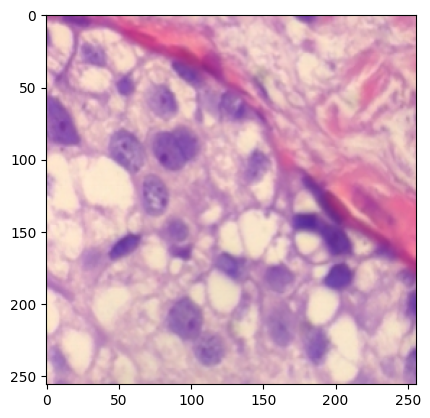

In [ ]:
index = 1
label = Y['out_class'][index].argmax()
print(label)
img = X[index]
plt.imshow((img*255).astype(np.uint8))
plt.show()

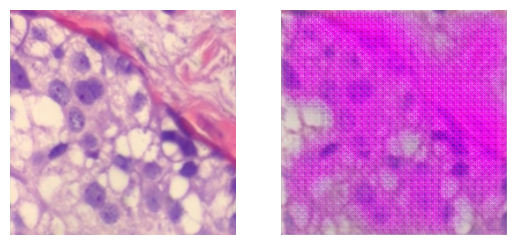

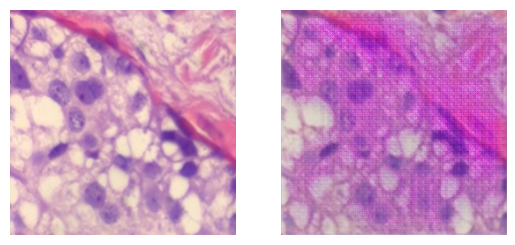

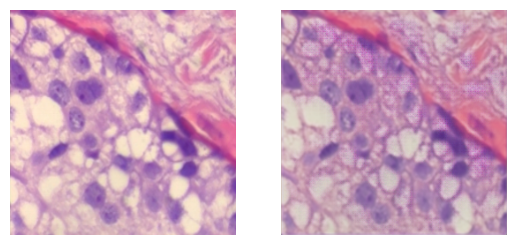

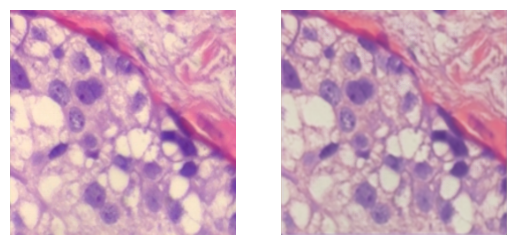

In [ ]:
activation_map = generate_activation_map(img, label, classifier, generator)

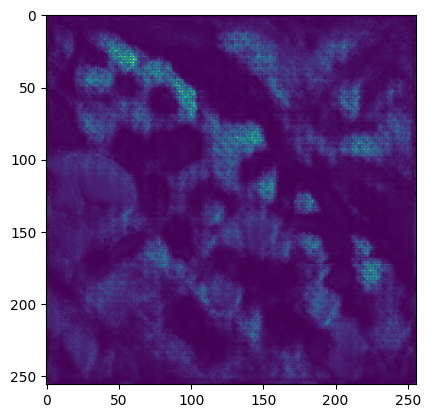

In [ ]:
activation_map.shape
plt.imshow(activation_map)

# Generating

In [ ]:
def run(index):
  label = Y['out_class'][index].argmax()
  print(index, label)
  img = X[index]
  activation_map = generate_activation_map(img, label, classifier, generator)
  print(activation_map.shape)
  plt.imshow(activation_map)
  plt.show()

3 6


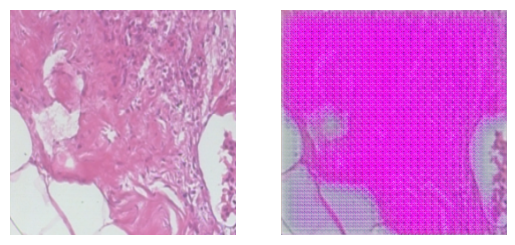

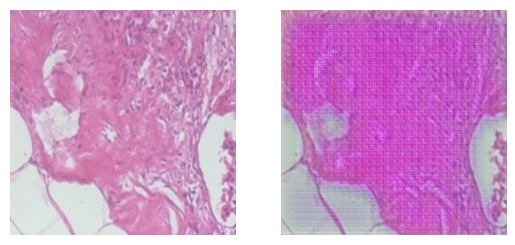

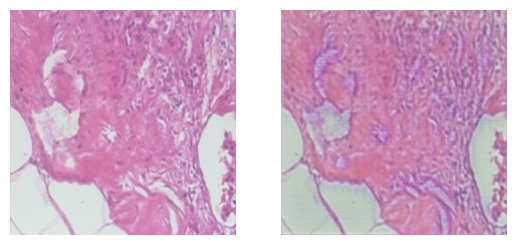

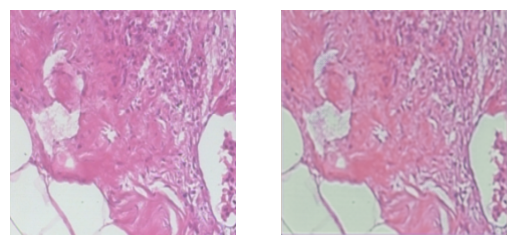

(256, 256)


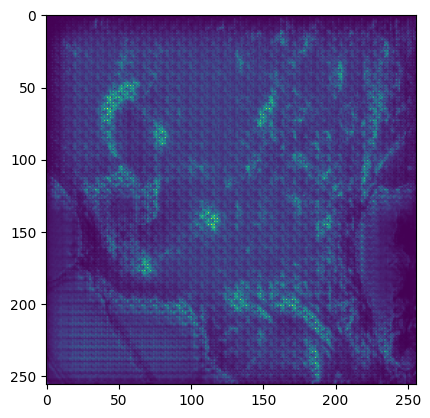

In [ ]:
run(3)

0 6


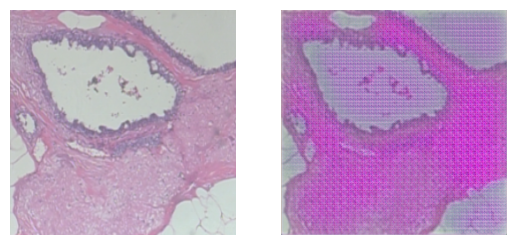

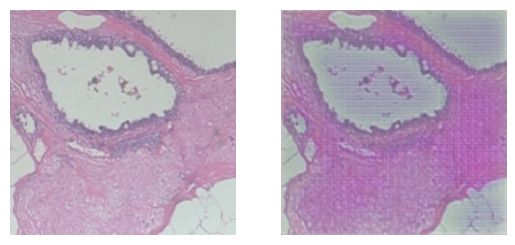

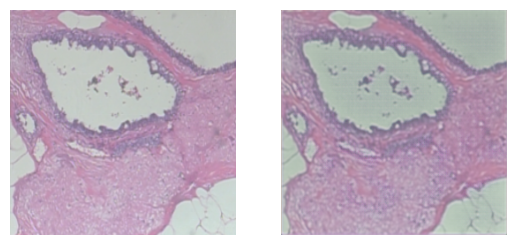

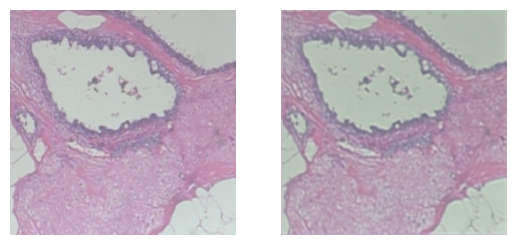

(256, 256)


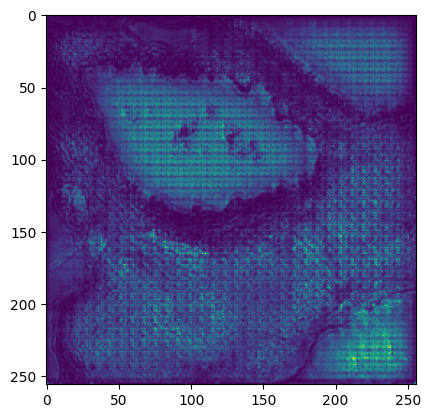

5 6


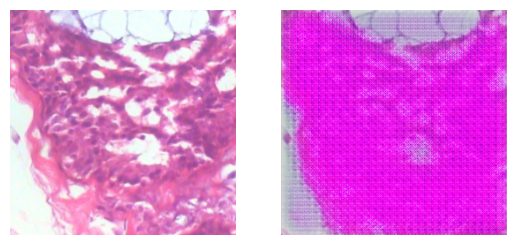

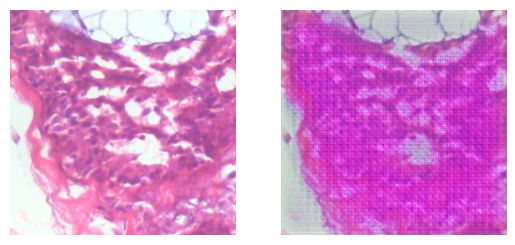

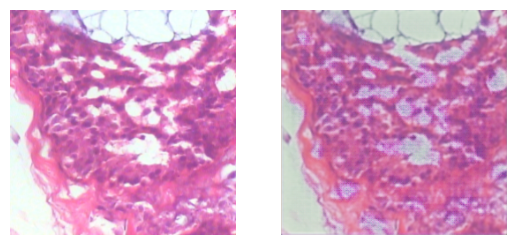

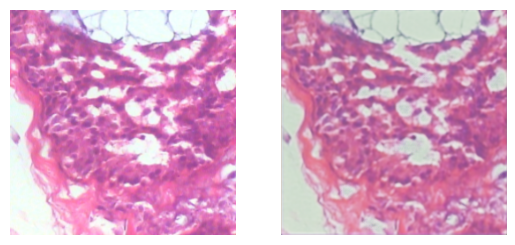

(256, 256)


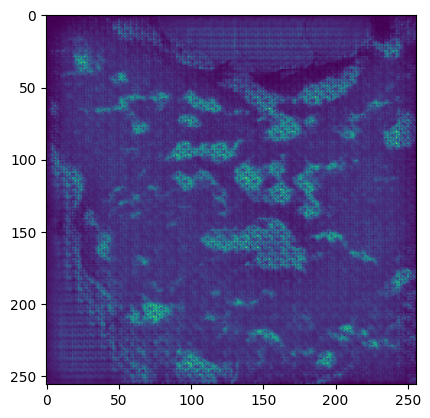

10 2


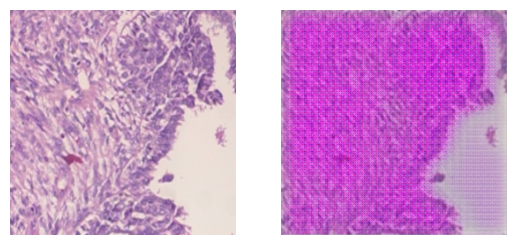

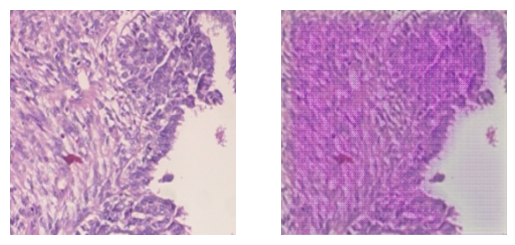

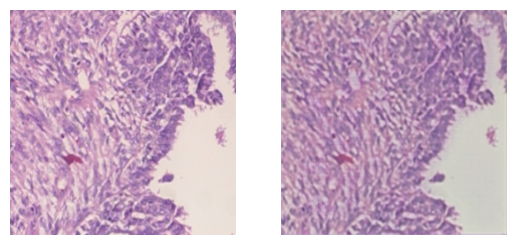

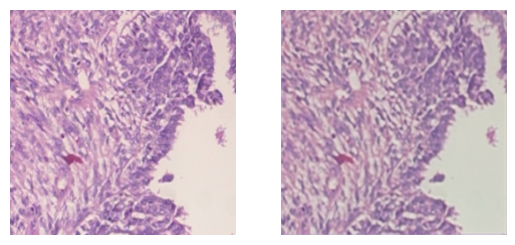

(256, 256)


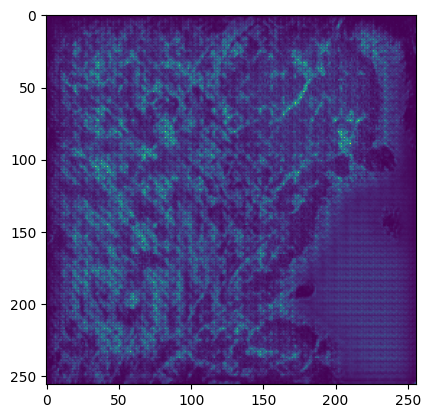

15 6


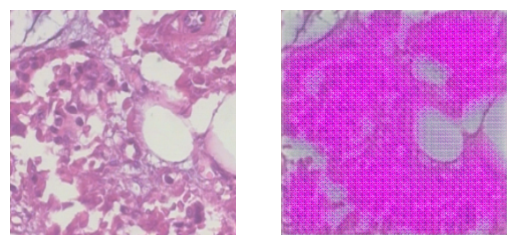

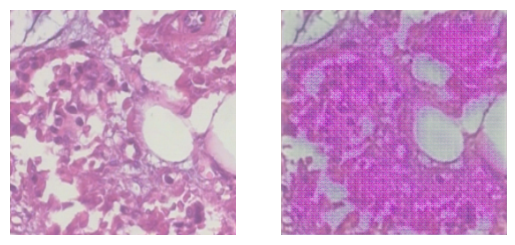

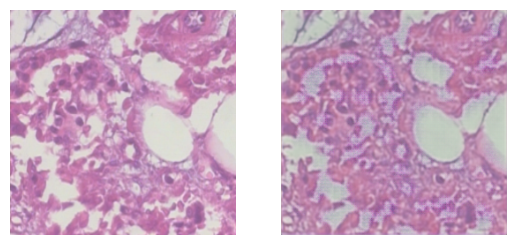

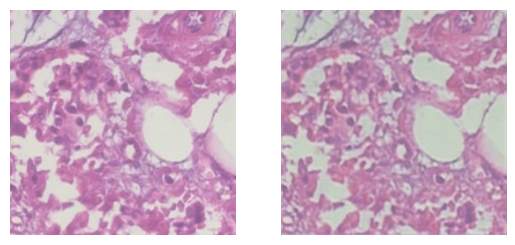

(256, 256)


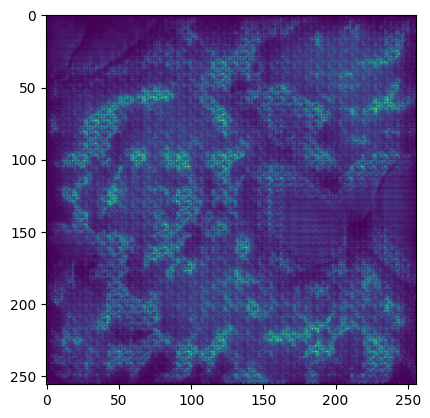

20 4


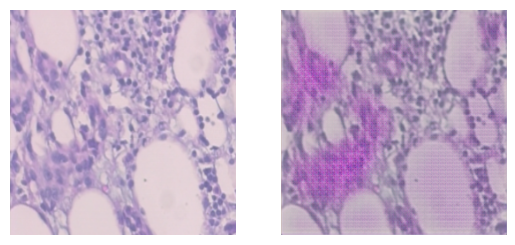

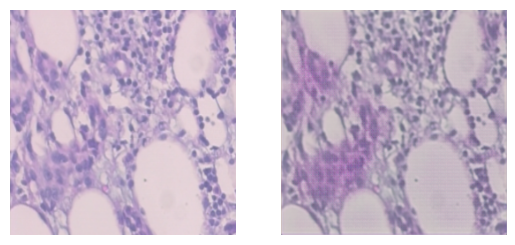

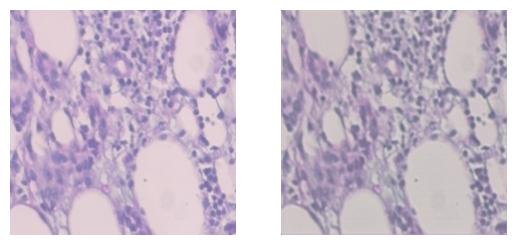

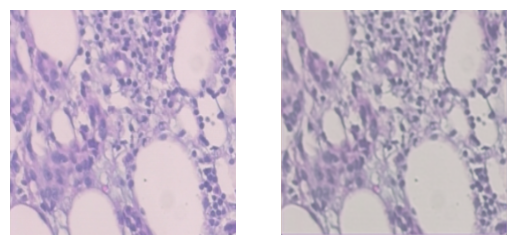

(256, 256)


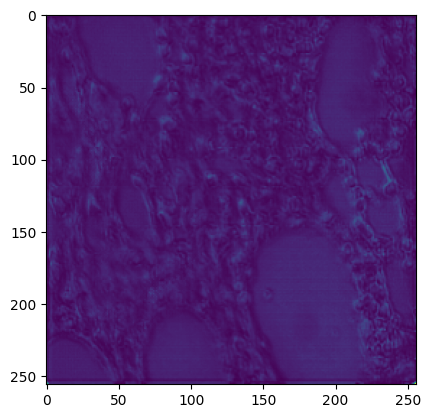

25 4


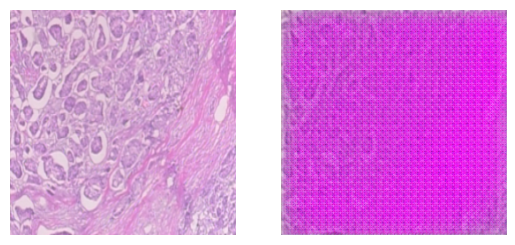

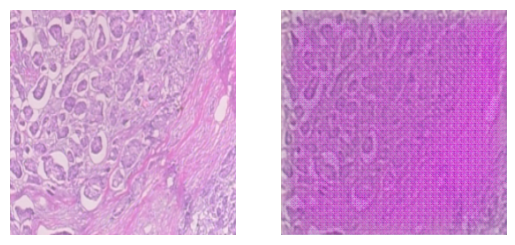

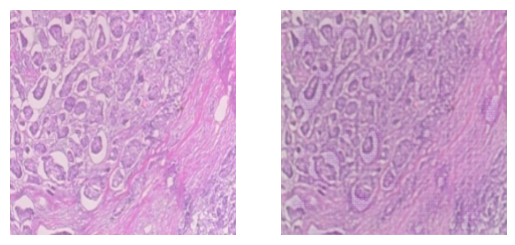

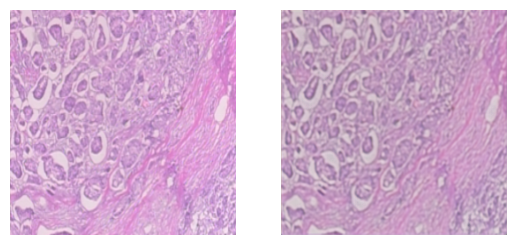

(256, 256)


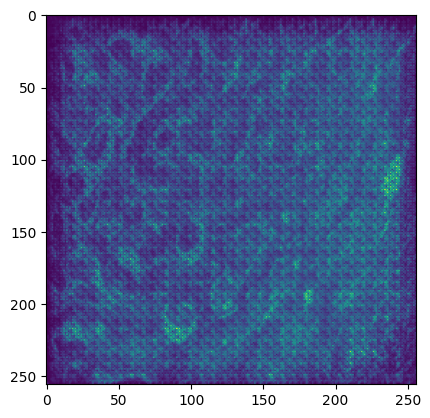

30 1


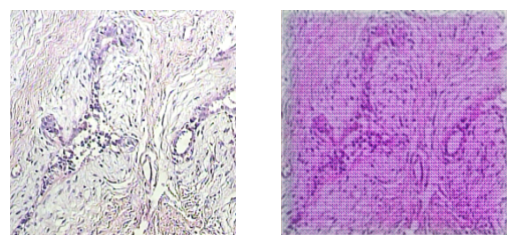

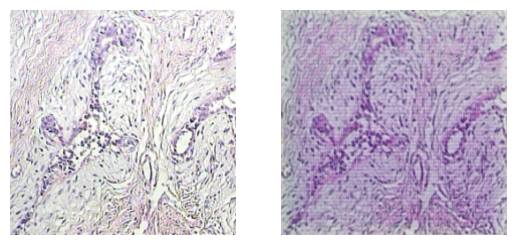

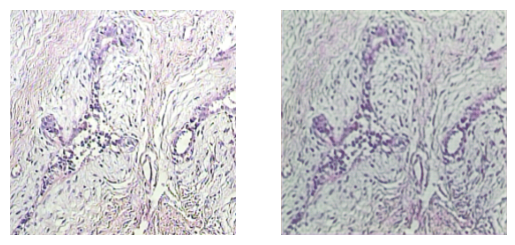

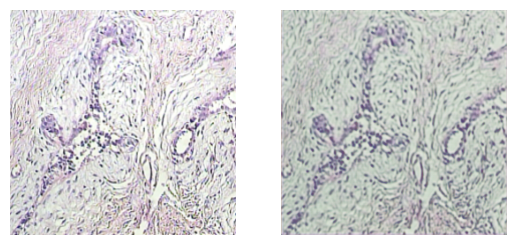

(256, 256)


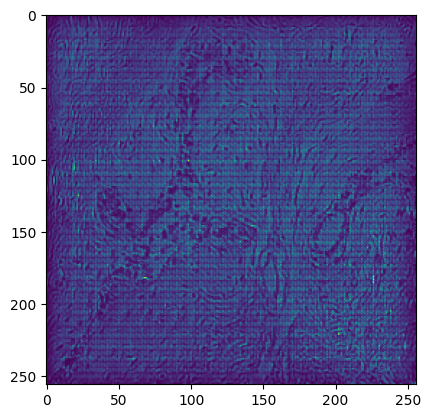

In [ ]:
for i in range(0, 32, 5):
  run(i)